In [1]:
import pyodbc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, fbeta_score, roc_auc_score, roc_curve

import lime.lime_tabular
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [45]:


cnxn = pyodbc.connect('DRIVER={ODBC Driver 17 for SQL Server};\
                      SERVER='+server+';\
                      DATABASE='+database+';\
                      UID='+username+';\
                      PWD='+ password)

cursor = cnxn.cursor()

In [46]:
#extract data from private database 
AbCartRows = "SELECT * FROM [bile].[dbo].[TblAbandonedCartRows]"
AbCarts = "SELECT * FROM [bile].[dbo].[TblAbandonedCarts]"
OrderRows = "SELECT * FROM [bile].[dbo].[TblOrderRows]"
Orders = "SELECT * FROM [bile].[dbo].[TblOrders]"


AbCartRows = pd.read_sql_query(AbCartRows, cnxn)
AbCarts = pd.read_sql_query(AbCarts, cnxn)
OrderRows = pd.read_sql_query(OrderRows, cnxn)
Orders = pd.read_sql_query(Orders, cnxn)

C:\Users\fsmith\AppData\Local\Temp\ipykernel_8380\2555701245.py:8: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  AbCartRows = pd.read_sql_query(AbCartRows, cnxn)
C:\Users\fsmith\AppData\Local\Temp\ipykernel_8380\2555701245.py:9: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  AbCarts = pd.read_sql_query(AbCarts, cnxn)
C:\Users\fsmith\AppData\Local\Temp\ipykernel_8380\2555701245.py:10: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  OrderRows = pd.read_sql_query(OrderRows, cnxn)
C:\Users\fsmith\AppData\Local\Temp\ipykernel_8380\

# Dataset creation

In [47]:
AbCarts = AbCarts.drop(columns=['FldMStoreID', 'FldMCouponCode', 'FldMCustomerGender', 'FldGUID',  'FldMCurrencyCode', 'FldMSubTotal',  'FldMTaxAmount', 'FldBCreatedAt', 'FldBUpdatedAt', 'FldMShippingAmount', 'FldMCustomerEmail', 'FldMCustomerFirstName', 'FldMCustomerMiddleName', 'FldMCustomerLastName', 'FldMIsVirtual', 'FldMBillingAddressID', 'FldMBillingFirstName', 'FldMBillingLastName', 'FldMBillingStreet', 'FldMBillingStreetNumber', 'FldMBillingStreetNumberAddition', 'FldMBillingPostalCode', 'FldMBillingCity', 'FldMBillingRegion', 'FldMBillingCountryID', 'FldMBillingPhone', 'FldMShippingAddressID', 'FldMShippingFirstName', 'FldMShippingLastName', 'FldMShippingStreet', 'FldMShippingStreetNumber', 'FldMShippingStreetNumberAddition', 'FldMShippingPostalCode', 'FldMShippingCity', 'FldMShippingRegion', 'FldMShippingCountryID', 'FldMShippingPhone', 'FldCopernicaProfileID'])

In [48]:
AbCarts['Ordered'] = 0 

In [49]:
columns = list(AbCarts.columns)
AbCarts

,FldAbandonedCartID,FldRelationIDFK,FldMCartID,FldMDiscountAmount,FldMGrandTotal,FldMCreatedAt,FldMUpdatedAt,Ordered
0,1,209538,529204,0.0,1544.63,20220808223101,20220809082009,0
1,2,209540,530221,0.0,908.26,20220809111556,20220809112044,0
2,3,209541,528394,0.0,136.24,20220808192856,20220809132016,0
3,4,209542,530746,0.0,28.88,20220809135257,20220809135749,0
4,5,209543,530848,0.0,495.04,20220809141951,20220809142140,0
...,...,...,...,...,...,...,...,...
16541,26541,1787543,2668846,0.0,230.58,20231009073551,20231009074334,0
16542,26542,1786678,2660314,0.0,800.83,20231007140129,20231009075342,0
16543,26543,948743,2648425,0.0,114.88,20231005102245,20231009075348,0
16544,26544,1787546,2668894,0.0,20.62,20231009080218,20231009080428,0


In [50]:
Orders = Orders.drop(columns=[ 'FldMStatus', 'FldMState', 'FldMOrderID', 'FldMTaxAmount', 'FldMShippingAmount', 'FldMCouponCode', 'FldMTaxAmount', 'FldMIsGuestCheckout', 'FldMIncrementID', 'FldMStoreID', 'FldMStoreName', 'FldBCorrectedIsGuestCheckout',
                                      'FldMAppliedRuleIDs', 'FldMCurrencyCode', 'FldMTotalPaid', 'FldMTotalDue', 'FldMPaymentMethod', 'FldMSubTotal', 'FldMCustomerGender', 'FldMCustomerEmail','FldMCustomerFirstName','FldMCustomerMiddleName', 'FldMCustomerLastName', 'FldMIsVirtual',  
                                      'FldMWeight', 'FldMShippingDescription', 'FldMBillingAddressID', 'FldMBillingMiddleName', 'FldMBillingFirstName', 'FldMBillingLastName',
                                      'FldMBillingStreet', 'FldMBillingStreetNumber', 'FldMBillingStreetNumberAddition',
                                      'FldMBillingPostalCode', 'FldMBillingCity', 'FldMBillingRegion', 'FldMBillingCountryID',
                                      'FldMBillingPhone', 'FldMShippingAddressID', 'FldMShippingMiddleName', 'FldMShippingStreet', 'FldMShippingFirstName', 'FldMShippingLastName', 
                                      'FldMShippingStreetNumber', 'FldMShippingStreetNumberAddition', 'FldMShippingPostalCode',
                                      'FldMShippingCity', 'FldMShippingRegion', 'FldMShippingCountryID', 'FldMShippingPhone',
                                      'FldMProtectCode', 'FldMRemoteIP', 'FldBConversionID', 'FldGUID', 'FldBCreatedAt', 'FldBUpdatedAt', 'FldCopernicaProfileID'])



In [51]:
Orders['Ordered'] = 1

In [52]:
Orders

,FldOrderID,FldRelationIDFK,FldMDiscountAmount,FldMGrandTotal,FldMQuoteID,FldMCreatedAt,FldMUpdatedAt,Ordered
0,1,209472,0.0,1104.00,5,20190918134240,20190918220003,1
1,2,209473,0.0,2208.00,9,20190925121443,20190925210003,1
2,3,209474,0.0,2354.00,13,20191011142035,20191011142041,1
3,4,209475,0.0,954.00,29,20200124160400,20200125010003,1
4,5,209476,0.0,3498.00,80,20200316212152,20200316212153,1
...,...,...,...,...,...,...,...,...
236930,296909,1509913,0.0,54.95,2669086,20231009092919,20231009093037,1
236931,296910,1787553,0.0,119.95,2669104,20231009093645,20231009093733,1
236932,296911,1787554,0.0,3739.00,2667412,20231009093857,20231009093859,1
236933,296912,1787555,0.0,29.95,2669122,20231009093859,20231009093941,1


In [53]:
AbCarts = AbCarts.rename(columns={
    "FldAbandonedCartID": "ID",
    "FldMCartID": "FldMQuoteID",
})

Orders = Orders.rename(columns={
    "FldOrderID": "ID"
})

all_data = pd.concat([AbCarts, Orders], axis=0, ignore_index=True)
all_data

,ID,FldRelationIDFK,FldMQuoteID,FldMDiscountAmount,FldMGrandTotal,FldMCreatedAt,FldMUpdatedAt,Ordered
0,1,209538,529204,0.0,1544.63,20220808223101,20220809082009,0
1,2,209540,530221,0.0,908.26,20220809111556,20220809112044,0
2,3,209541,528394,0.0,136.24,20220808192856,20220809132016,0
3,4,209542,530746,0.0,28.88,20220809135257,20220809135749,0
4,5,209543,530848,0.0,495.04,20220809141951,20220809142140,0
...,...,...,...,...,...,...,...,...
253476,296909,1509913,2669086,0.0,54.95,20231009092919,20231009093037,1
253477,296910,1787553,2669104,0.0,119.95,20231009093645,20231009093733,1
253478,296911,1787554,2667412,0.0,3739.00,20231009093857,20231009093859,1
253479,296912,1787555,2669122,0.0,29.95,20231009093859,20231009093941,1


# Feature Engineering 

In [54]:
AbCartRows_dropped = AbCartRows.drop(columns=['FldMName', 'FldMProductOptions', 'FldMSKU', 'FldMTaxPercent', 'FldBCreatedAt', 'FldBUpdatedAt', 'FldMTaxAmount', 'FldBAbandonedCartRowIsDeleted', 'FldBFingerprint', 'FldBCreatedAt', 'FldBUpdatedAt', 'FldCopernicaProfileID'])

Abcarts_merged = AbCarts.merge(AbCartRows_dropped, left_on=['ID', 'FldMQuoteID'], right_on=['FldAbandonedCartIDFK', 'FldMQuoteID'], how='inner')
Abcarts_merged = Abcarts_merged.rename(columns={"FldMDiscountAmount_x": "FldMDiscountAmount_total", "FldMDiscountAmount_y": "FldMDiscountAmount_row"})
Abcarts_merged['Ordered'] = 0
Abcarts_merged = Abcarts_merged.drop(columns=['FldAbandonedCartIDFK'])

orderrows_dropped = OrderRows.drop(columns=['FldMName', 'FldMProductOptions', 'FldMQuoteItemID', 'FldMProductID','FldMStoreID', 'FldMParentItemID', 'FldMIsVirtual', 'FldMFreeShipping', 'FldMSKU',
                                            'FldMQtyInvoiced', 'FldMQtyShipped', 'FldMCreatedAt', 'FldMUpdatedAt',  'FldMQtyCanceled', 'FldMQtyReturned', 'FldMQtyRefunded', 'FldMTaxPercent', 'FldMAmountRefunded',
                                            'FldMPriceInclTax', 'FldMOriginalPrice', 'FldMAmountRefunded', 'FldMRowTotalInclTax', 'FldMPriceInclTax', 'FldMTaxAmount',
                                            'FldMRowInvoiced', 'FldMRowWeight', 'FldBCreatedAt', 'FldBUpdatedAt', 'FldBConversionID', 'FldBOrderRowIsDeleted', 'FldCopernicaProfileID'])

orders_merged = Orders.merge(orderrows_dropped, left_on='ID', right_on='FldOrderIDFK', how='inner')
orders_merged = orders_merged.rename(columns={"FldMDiscountAmount_x": "FldMDiscountAmount_total", "FldMDiscountAmount_y": "FldMDiscountAmount_row"})
orders_merged['Ordered'] = 1
orders_merged = orders_merged.drop(columns=['FldOrderIDFK'])

Abcarts_merged = Abcarts_merged.rename(columns={
    "FldAbandonedCartRowID": "FldRowID",
    "FldMQty": "FldMQty"  
})

orders_merged = orders_merged.rename(columns={
    "FldOrderRowID": "FldRowID",
    "FldMQtyOrdered": "FldMQty"
})

all_concat = pd.concat([Abcarts_merged, orders_merged], axis=0, ignore_index=True)
all_concat

,ID,FldRelationIDFK,FldMQuoteID,FldMDiscountAmount_total,FldMGrandTotal,FldMCreatedAt,FldMUpdatedAt,Ordered,FldRowID,FldMItemID,FldMProductType,FldMQty,FldMPrice,FldMDiscountPercent,FldMDiscountAmount_row,FldMRowTotal
0,1,209538,529204,0.0,1544.63,20220808223101,20220809082009,0,1,727141,simple,1.0,1544.63,0.0,0.0,1544.63
1,2,209540,530221,0.0,908.26,20220809111556,20220809112044,0,2,727795,simple,1.0,908.26,0.0,0.0,908.26
2,3,209541,528394,0.0,136.24,20220808192856,20220809132016,0,3,728203,simple,3.0,45.41,0.0,0.0,136.24
3,4,209542,530746,0.0,28.88,20220809135257,20220809135749,0,4,728569,simple,1.0,28.88,0.0,0.0,28.88
4,5,209543,530848,0.0,495.04,20220809141951,20220809142140,0,5,728692,simple,1.0,495.04,0.0,0.0,495.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
403707,296909,1509913,2669086,0.0,54.95,20231009092919,20231009093037,1,437385,1132084,simple,1.0,45.41,0.0,0.0,45.41
403708,296910,1787553,2669104,0.0,119.95,20231009093645,20231009093733,1,437386,1132087,simple,1.0,99.13,0.0,0.0,99.13
403709,296911,1787554,2667412,0.0,3739.00,20231009093857,20231009093859,1,437387,1132090,simple,1.0,3090.08,0.0,0.0,3090.08
403710,296912,1787555,2669122,0.0,29.95,20231009093859,20231009093941,1,437388,1132093,simple,1.0,24.75,0.0,0.0,24.75


In [55]:
#This counts the amount of products the user has in the abandoned cart
total_amount_products  = all_concat.groupby('FldMQuoteID')['FldMQty'].sum().reset_index()
total_amount_products.columns = ['FldMQuoteID', 'Tot_nr_prod']

all_data = all_data.merge(total_amount_products, on='FldMQuoteID', how='left')


In [56]:
# This calculates the mean viewed price of the cart
mean_grand_total_per_order = all_concat.groupby('FldMQuoteID')['FldMRowTotal'].mean().reset_index()
mean_grand_total_per_order.columns = ['FldMQuoteID', 'MeanGrandTotal']

all_data = all_data.merge(mean_grand_total_per_order, on='FldMQuoteID', how='left')

In [57]:
# This calculates the max viewed price of the abandoned cart
max_price_per_user = all_concat.groupby('FldMQuoteID')['FldMPrice'].max().reset_index()
max_price_per_user.columns = ['FldMQuoteID', 'MaxViewedPrice']
all_data = all_data.merge(max_price_per_user, on='FldMQuoteID', how='left')

In [58]:
# This calculates the min viewed price of the abandoned cart
min_price_per_user = all_concat.groupby('FldMQuoteID')['FldMPrice'].min().reset_index()
min_price_per_user.columns = ['FldMQuoteID', 'MinViewedPrice']
all_data = all_data.merge(min_price_per_user, on='FldMQuoteID', how='left')

In [59]:
#Create a new column to identify discounted products (1 for discounted, 0 for non-discounted)
all_concat['IsDiscounted'] = all_concat['FldMDiscountPercent'].apply(lambda x: 1 if x > 0 else 0)

# Group the data by quoteID and calculate the ratio of discounted products vs. non-discounted products
discount_ratio = all_concat.groupby('FldMQuoteID')['IsDiscounted'].mean().reset_index()
discount_ratio.columns = ['FldMQuoteID', 'discount_ratio']
all_data = all_data.merge(discount_ratio, on='FldMQuoteID', how='left')

In [60]:
# Calculates the total amount of orders a customer has made 
total_orders = Orders.groupby('FldRelationIDFK')['ID'].nunique().reset_index()
total_orders.columns = ['FldRelationIDFK', 'total_orders']
all_data = all_data.merge(total_orders, on='FldRelationIDFK', how='left')

all_data['total_orders'] = all_data['total_orders'].fillna(0)

In [61]:
# Check whether the customer with abandoned cart, has ordered before
users_with_orders = all_concat[all_concat['Ordered'] == 1]['FldRelationIDFK'].unique()
all_data['returning_visitor'] = all_concat['FldRelationIDFK'].apply(lambda x: 1 if x in users_with_orders else 0)

In [62]:
# The amount of different products 
diff_products = all_concat.groupby('FldMQuoteID')['FldMItemID'].nunique().reset_index()
diff_products.columns = ['FldMQuoteID', 'DiffProducts']
all_data = all_data.merge(diff_products, on='FldMQuoteID', how='left')

In [63]:
all_data.to_csv('all_data_clean.csv', index=False)

In [64]:
all_data = pd.read_csv('all_data_clean.csv')
all_data

,ID,FldRelationIDFK,FldMQuoteID,FldMDiscountAmount,FldMGrandTotal,FldMCreatedAt,FldMUpdatedAt,Ordered,Tot_nr_prod,MeanGrandTotal,MaxViewedPrice,MinViewedPrice,discount_ratio,total_orders,returning_visitor,DiffProducts
0,1,209538,529204,0.0,1544.63,20220808223101,20220809082009,0,1.0,1544.63,1544.63,1544.63,0.0,1.0,1,1.0
1,2,209540,530221,0.0,908.26,20220809111556,20220809112044,0,1.0,908.26,908.26,908.26,0.0,0.0,0,1.0
2,3,209541,528394,0.0,136.24,20220808192856,20220809132016,0,3.0,136.24,45.41,45.41,0.0,3.0,1,1.0
3,4,209542,530746,0.0,28.88,20220809135257,20220809135749,0,1.0,28.88,28.88,28.88,0.0,0.0,0,1.0
4,5,209543,530848,0.0,495.04,20220809141951,20220809142140,0,1.0,495.04,495.04,495.04,0.0,1.0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253476,296909,1509913,2669086,0.0,54.95,20231009092919,20231009093037,1,1.0,45.41,45.41,45.41,0.0,1.0,1,1.0
253477,296910,1787553,2669104,0.0,119.95,20231009093645,20231009093733,1,1.0,99.13,99.13,99.13,0.0,1.0,1,1.0
253478,296911,1787554,2667412,0.0,3739.00,20231009093857,20231009093859,1,1.0,3090.08,3090.08,3090.08,0.0,1.0,1,1.0
253479,296912,1787555,2669122,0.0,29.95,20231009093859,20231009093941,1,1.0,24.75,24.75,24.75,0.0,1.0,1,1.0


In [65]:
all_data = all_data.dropna()

In [66]:
all_data['FldMCreatedAt'] = pd.to_datetime(all_data['FldMCreatedAt'], format='%Y%m%d%H%M%S')
all_data['Hour_Created'] = all_data['FldMCreatedAt'].dt.hour

C:\Users\fsmith\AppData\Local\Temp\ipykernel_8380\48474080.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['FldMCreatedAt'] = pd.to_datetime(all_data['FldMCreatedAt'], format='%Y%m%d%H%M%S')
C:\Users\fsmith\AppData\Local\Temp\ipykernel_8380\48474080.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['Hour_Created'] = all_data['FldMCreatedAt'].dt.hour


# Data Pre-Processing

In [67]:
all_data['FldMGrandTotal'].describe()

count    253407.000000
mean        705.700250
std         960.803964
min           0.000000
25%          69.900000
50%         389.000000
75%        1149.000000
max      139770.000000
Name: FldMGrandTotal, dtype: float64

In [68]:
buckets = [0,70, 389, 1149, 139770]  # Min, 25%, 50%, 75%, Max

def bucket_value(value, buck):
    if value <= buck[1]:
        return 'Small_order'
    elif value <= buck[2]:
        return 'Medium_order'
    elif value <= buck[3]:
        return 'Semi-big_order'
    else:
        return 'Big_order'

# to create new column with bucket labels
all_data['Order_Bucket'] = all_data['FldMGrandTotal'].apply(lambda x: bucket_value(x, buckets))

#one-hot encoding
all_data = pd.concat([all_data, pd.get_dummies(all_data['Order_Bucket'])], axis=1)

all_data['Small_order'] = all_data['Small_order'].astype(int)
all_data['Medium_order'] = all_data['Medium_order'].astype(int)
all_data['Semi-big_order'] = all_data['Semi-big_order'].astype(int)
all_data['Big_order'] = all_data['Big_order'].astype(int)


C:\Users\fsmith\AppData\Local\Temp\ipykernel_8380\1363047291.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_data['Order_Bucket'] = all_data['FldMGrandTotal'].apply(lambda x: bucket_value(x, buckets))


In [69]:
all_data['discount_amount'] = all_data['FldMDiscountAmount'].apply(lambda x: 0 if x == 0 else 1)

In [70]:
#0 for only one product, 1 if more products 
all_data['Total_nr_products'] = all_data['Tot_nr_prod'].apply(lambda x: 0 if x == 1 else 1)

In [71]:
#all_data = all_data[all_data['MeanGrandTotal'] >= 0]
all_data['MeanGrandTotal'].describe()

count    253407.000000
mean        423.476082
std         639.550749
min        -118.890000
25%          45.410000
50%         230.580000
75%         598.760000
max      115512.400000
Name: MeanGrandTotal, dtype: float64

In [72]:
buckets = [230, 600, 115513]  # 50% 75% max

def bucket_value(value, buck):
    if value <= buck[0]:
        return 'Small_average'
    elif value <= buck[1]:
        return 'Medium_average'
    else:
        return 'Big_average'

all_data['Order_average'] = all_data['MeanGrandTotal'].apply(lambda x: bucket_value(x, buckets))
all_data = pd.concat([all_data, pd.get_dummies(all_data['Order_average'])], axis=1)

all_data['Small_average'] = all_data['Small_average'].astype(int)
all_data['Medium_average'] = all_data['Medium_average'].astype(int)
all_data['Big_average'] = all_data['Big_average'].astype(int)

In [73]:
all_data['MaxViewedPrice'].describe()

count    253407.000000
mean        551.611232
std         629.628342
min           0.000000
25%          49.550000
50%         289.340000
75%         951.730000
max        8569.420000
Name: MaxViewedPrice, dtype: float64

In [74]:
buckets = [290, 952, 8570]  # 50% 75% max

def bucket_value(value, buck):
    if value <= buck[0]:
        return 'Small_maxvp'
    elif value <= buck[1]:
        return 'Medium_maxvp'
    else:
        return 'Big_maxvp'

all_data['Max_viewed_price'] = all_data['MaxViewedPrice'].apply(lambda x: bucket_value(x, buckets))

all_data = pd.concat([all_data, pd.get_dummies(all_data['Max_viewed_price'])], axis=1)
all_data['Small_maxvp'] = all_data['Small_maxvp'].astype(int)
all_data['Medium_maxvp'] = all_data['Medium_maxvp'].astype(int)
all_data['Big_maxvp'] = all_data['Big_maxvp'].astype(int)

In [75]:
# if total orders is 0 > 0, if 1 > 1, if more than 1 previous order > 2 
all_data['Total_orders'] = all_data['total_orders'].apply(lambda x: 0 if x == 0 else (1 if x == 1 else 2))

In [76]:
#no variation in products = 0, variation in products = 1
all_data['Different_products'] = all_data['DiffProducts'].apply(lambda x: 0 if x == 1 else 1)

In [77]:
buckets = [6, 12, 18, 23]  #night, morning, afternoon, evening

def bucket_value(value, buck):
    if value <= buck[0]:
        return 'night'
    elif value <= buck[1]:
        return 'morning'
    elif value <= buck[2]:
        return 'afternoon'
    else:
        return 'evening'

all_data['Time_created'] = all_data['Hour_Created'].apply(lambda x: bucket_value(x, buckets))

all_data = pd.concat([all_data, pd.get_dummies(all_data['Time_created'])], axis=1)

all_data['night'] = all_data['night'].astype(int)
all_data['morning'] = all_data['morning'].astype(int)
all_data['afternoon'] = all_data['afternoon'].astype(int)
all_data['evening'] = all_data['evening'].astype(int)

In [78]:
all_data['MinViewedPrice'].describe()


count    253407.000000
mean        289.701957
std         517.030082
min        -145.450000
25%           0.000000
50%          40.500000
75%         288.430000
max        8569.420000
Name: MinViewedPrice, dtype: float64

In [79]:
buckets = [41, 289, 8570]  # 50% 75% max

def bucket_value(value, buck):
    if value <= buck[0]:
        return 'Small_minvp'
    elif value <= buck[1]:
        return 'Medium_minvp'
    else:
        return 'Big_minvp'

all_data['Min_viewed_price'] = all_data['MinViewedPrice'].apply(lambda x: bucket_value(x, buckets))

all_data = pd.concat([all_data, pd.get_dummies(all_data['Min_viewed_price'])], axis=1)
all_data['Small_minvp'] = all_data['Small_minvp'].astype(int)
all_data['Medium_minvp'] = all_data['Medium_minvp'].astype(int)
all_data['Big_minvp'] = all_data['Big_minvp'].astype(int)

In [80]:
all_data.to_csv('all_data_correct.csv', index=False)

# Data Modeling

In [2]:
all_data = pd.read_csv('all_data_correct.csv')

In [3]:
all_data = all_data.drop(columns={'ID', 'FldRelationIDFK', 'FldMQuoteID', 'FldMDiscountAmount',
                                  'FldMGrandTotal', 'FldMCreatedAt', 'FldMUpdatedAt', 
                                  'Tot_nr_prod', 'MeanGrandTotal', 'MaxViewedPrice', 'MinViewedPrice',
                                  'discount_ratio', 'total_orders', 'returning_visitor', 'DiffProducts',
                                  'Order_Bucket',  'Order_average', 'Max_viewed_price',
                                   'Hour_Created', 'Time_created',  'Min_viewed_price', })

In [4]:
rename_dict = {
    'discount_amount': 'Discount_amount',
    'Big_average': 'High_average_total',
    'Medium_average': 'Medium_average_total',
    'Small_average': 'Low_average_total',
    'Big_maxvp': 'High_max_viewed_price',
    'Medium_maxvp': 'Medium_max_viewed_price',
    'Small_maxvp': 'Low_max_viewed_price',
    'Big_minvp': 'High_min_viewed_price',
    'Medium_minvp': 'Medium_min_viewed_priced',
    'Small_minvp': 'Low_min_viewed_price'
}

all_data.rename(columns=rename_dict, inplace=True)

In [84]:
all_data

,Ordered,Big_order,Medium_order,Semi-big_order,Small_order,Discount_amount,Total_nr_products,High_average_total,Medium_average_total,Low_average_total,...,Low_max_viewed_price,Total_orders,Different_products,afternoon,evening,morning,night,High_min_viewed_price,Medium_min_viewed_priced,Low_min_viewed_price
0,0,1,0,0,0,0,0,1,0,0,...,0,1,0,0,1,0,0,1,0,0
1,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,0,1,0,1,0,0
2,0,0,1,0,0,0,1,0,0,1,...,1,2,0,0,1,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,1,...,1,0,0,1,0,0,0,0,0,1
4,0,0,0,1,0,0,0,0,1,0,...,0,1,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252667,1,0,0,0,1,0,0,0,0,1,...,1,1,0,0,0,1,0,0,1,0
252668,1,0,1,0,0,0,0,0,0,1,...,1,1,0,0,0,1,0,0,1,0
252669,1,1,0,0,0,0,0,1,0,0,...,0,1,0,0,0,1,0,1,0,0
252670,1,0,0,0,1,0,0,0,0,1,...,1,1,0,0,0,1,0,0,0,1


Text(0.5, 1.0, 'Shopping cart abandonment/purchases')

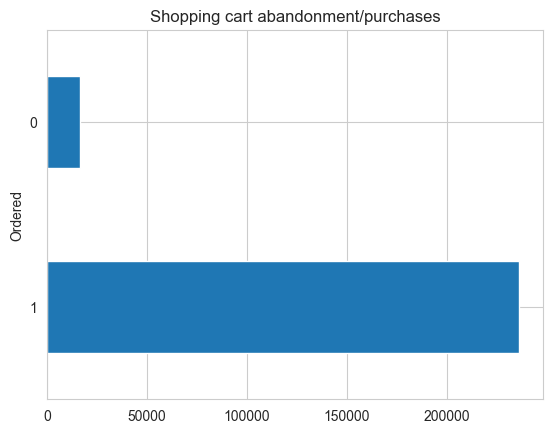

In [85]:
all_data['Ordered'].value_counts().plot(kind='barh')
plt.title('Shopping cart abandonment/purchases')

In [86]:
all_data['Ordered'].value_counts()

Ordered
1    236199
0     16473
Name: count, dtype: int64

In [87]:
all_data.columns

Index(['Ordered', 'Big_order', 'Medium_order', 'Semi-big_order', 'Small_order',
       'Discount_amount', 'Total_nr_products', 'High_average_total',
       'Medium_average_total', 'Low_average_total', 'High_max_viewed_price',
       'Medium_max_viewed_price', 'Low_max_viewed_price', 'Total_orders',
       'Different_products', 'afternoon', 'evening', 'morning', 'night',
       'High_min_viewed_price', 'Medium_min_viewed_priced',
       'Low_min_viewed_price'],
      dtype='object')

In [5]:
# Split the dataset into two subsets based on the 'Ordered' column
ordered_0 = all_data[all_data['Ordered'] == 1]
ordered_1 = all_data[all_data['Ordered'] == 0]

# 'Ordered' equal to 1
num_ordered_1 = ordered_1.shape[0]

# Randomly sample rows with 'Ordered' equal to 0 to match the number of rows with 'Ordered' equal to 1
ordered_0_downsampled = ordered_0.sample(n=num_ordered_1, replace=False, random_state=42) 
downsampled_data = pd.concat([ordered_0_downsampled, ordered_1])
downsampled_data = downsampled_data.sample(frac=1, random_state=42).reset_index(drop=True)  

print(downsampled_data['Ordered'].value_counts())

all_data = downsampled_data

Ordered
0    16473
1    16473
Name: count, dtype: int64


###  t-SNE plot

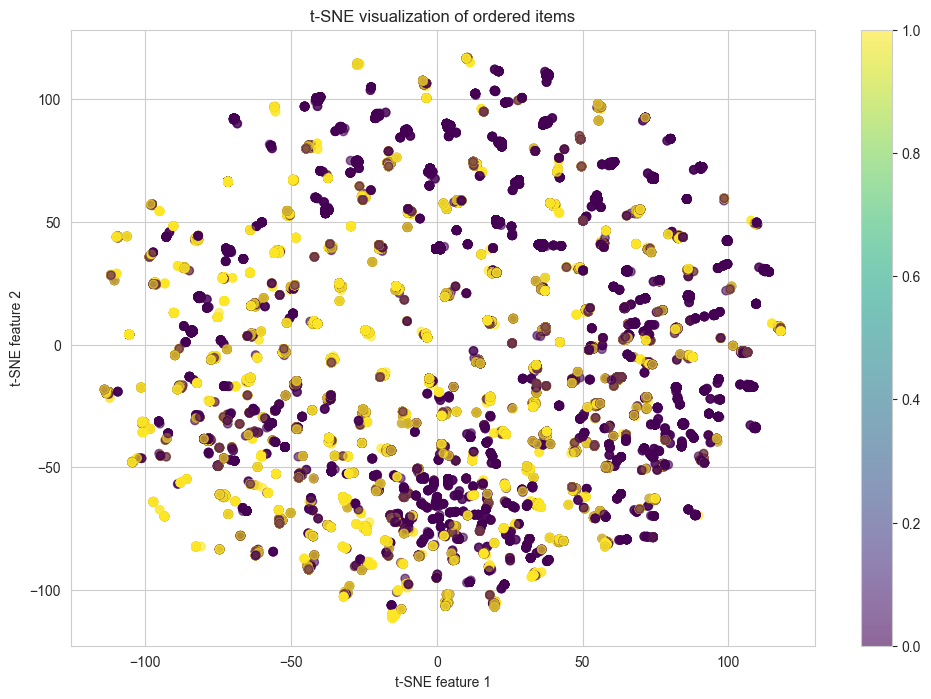

In [89]:
from sklearn.manifold import TSNE

features = ['Big_order', 'Medium_order', 'Semi-big_order', 'Small_order',
            'Discount_amount', 'Total_nr_products', 'High_average_total',
            'Medium_average_total', 'Low_average_total', 'High_max_viewed_price',
            'Medium_max_viewed_price', 'Low_max_viewed_price', 'Total_orders',
            'Different_products', 'afternoon', 'evening', 'morning', 'night',
            'High_min_viewed_price', 'Medium_min_viewed_priced',
            'Low_min_viewed_price']

# Select your features excluding the 'ordered' column for t-SNE
X = all_data.drop('Ordered', axis=1)
X = X.loc[: , features]

# Run t-SNE to reduce the data to two dimensions
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)

# Plot the results of t-SNE with the 'ordered' column
plt.figure(figsize=(12, 8))

# Assuming 'ordered' is a binary column where 0 represents 'not ordered' and 1 represents 'ordered'
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=all_data['Ordered'], cmap='viridis', marker='o', alpha=0.6)

# Create a colorbar
plt.colorbar(scatter)

# Label the plot
plt.title('t-SNE visualization of ordered items')
plt.xlabel('t-SNE feature 1')
plt.ylabel('t-SNE feature 2')
plt.show()


### Feature selection

In [6]:
cat_features = ['Big_order', 'Medium_order', 'Semi-big_order', 'Small_order',
                'Discount_amount', 'Total_nr_products', 'High_average_total',
                'Medium_average_total', 'Low_average_total', 'High_max_viewed_price',
                'Medium_max_viewed_price', 'Low_max_viewed_price', 'Total_orders',
                'Different_products', 'afternoon', 'evening', 'morning', 'night',
                'High_min_viewed_price', 'Medium_min_viewed_priced',
                'Low_min_viewed_price']


## Train & Test 

In [7]:
X = all_data.drop('Ordered', axis=1) 
X = X.loc[: , cat_features]
y = all_data['Ordered']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

### First model using CatBoost

#### Model initialization & training 

In [8]:
cat_model = CatBoostClassifier(loss_function='Logloss')


In [9]:
grid = {'learning_rate': [0.01, 0.05, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}

grid_search_result = cat_model.grid_search(grid,
                                           X=X_train,
                                           y=y_train,
                                           plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6851549	test: 0.6849834	best: 0.6849834 (0)	total: 162ms	remaining: 2m 41s
1:	learn: 0.6774190	test: 0.6770712	best: 0.6770712 (1)	total: 175ms	remaining: 1m 27s
2:	learn: 0.6697034	test: 0.6692157	best: 0.6692157 (2)	total: 190ms	remaining: 1m 2s
3:	learn: 0.6628107	test: 0.6621052	best: 0.6621052 (3)	total: 202ms	remaining: 50.4s
4:	learn: 0.6558449	test: 0.6550033	best: 0.6550033 (4)	total: 214ms	remaining: 42.6s
5:	learn: 0.6495841	test: 0.6485902	best: 0.6485902 (5)	total: 225ms	remaining: 37.2s
6:	learn: 0.6435352	test: 0.6423922	best: 0.6423922 (6)	total: 239ms	remaining: 33.9s
7:	learn: 0.6377829	test: 0.6364961	best: 0.6364961 (7)	total: 256ms	remaining: 31.7s
8:	learn: 0.6323874	test: 0.6309661	best: 0.6309661 (8)	total: 267ms	remaining: 29.4s
9:	learn: 0.6272308	test: 0.6257018	best: 0.6257018 (9)	total: 280ms	remaining: 27.7s
10:	learn: 0.6226849	test: 0.6209493	best: 0.6209493 (10)	total: 296ms	remaining: 26.6s
11:	learn: 0.6179914	test: 0.6161269	best: 0.61612

In [10]:
cat_model = CatBoostClassifier(loss_function='Logloss', depth=4, l2_leaf_reg=5, learning_rate=0.1)
cat_model.fit(X_train, y_train)

0:	learn: 0.6312082	total: 16.8ms	remaining: 16.8s
1:	learn: 0.5898044	total: 36ms	remaining: 18s
2:	learn: 0.5617992	total: 52.6ms	remaining: 17.5s
3:	learn: 0.5450763	total: 68.1ms	remaining: 17s
4:	learn: 0.5334184	total: 82.2ms	remaining: 16.4s
5:	learn: 0.5224690	total: 130ms	remaining: 21.5s
6:	learn: 0.5150270	total: 149ms	remaining: 21.2s
7:	learn: 0.5101830	total: 166ms	remaining: 20.6s
8:	learn: 0.5037729	total: 181ms	remaining: 20s
9:	learn: 0.4998199	total: 196ms	remaining: 19.4s
10:	learn: 0.4965796	total: 213ms	remaining: 19.1s
11:	learn: 0.4938324	total: 234ms	remaining: 19.2s
12:	learn: 0.4919103	total: 249ms	remaining: 18.9s
13:	learn: 0.4877401	total: 270ms	remaining: 19s
14:	learn: 0.4842384	total: 292ms	remaining: 19.1s
15:	learn: 0.4815960	total: 318ms	remaining: 19.6s
16:	learn: 0.4799656	total: 340ms	remaining: 19.6s
17:	learn: 0.4785575	total: 361ms	remaining: 19.7s
18:	learn: 0.4772700	total: 384ms	remaining: 19.8s
19:	learn: 0.4755098	total: 402ms	remaining: 1

#### Model evaluation

In [11]:
y_pred = cat_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f05_score = fbeta_score(y_test, y_pred, beta=0.5)  # F0.5 score (more weight on precision)
roc_auc = roc_auc_score(y_test, cat_model.predict_proba(X_test)[:, 1])

print('accuracy = ', accuracy)
print('precision = ', precision)
print('recall = ', recall)
print('f05_score = ', f05_score)
print('roc_auc = ', roc_auc)

accuracy =  0.7573596358118361
precision =  0.7058252427184466
recall =  0.8825493171471928
f05_score =  0.7352718078381797
roc_auc =  0.8477693014430748


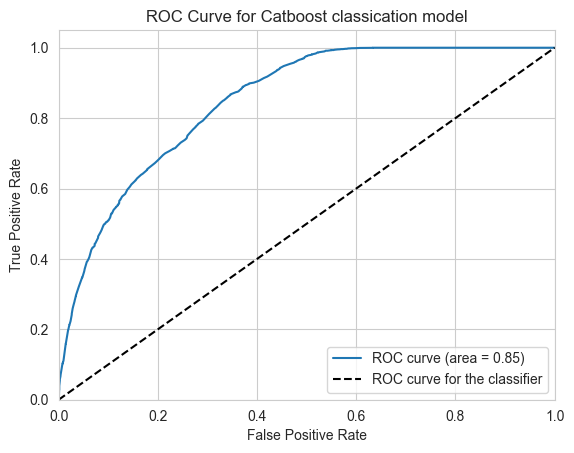

In [12]:
#Plot the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, cat_model.predict_proba(X_test)[:, 1])
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='ROC curve for the classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Catboost classication model')
plt.legend()
plt.show()

### Second model - XGBoost 

In [13]:
xg_model = XGBClassifier(objective='binary:logistic')
xg_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [14]:
y_pred = xg_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f05_score = fbeta_score(y_test, y_pred, beta=0.5)  # F0.5 score (more weight on precision)
roc_auc = roc_auc_score(y_test, xg_model.predict_proba(X_test)[:, 1])

print('accuracy = ', accuracy)
print('precision = ', precision)
print('recall = ', recall)
print('f05_score = ', f05_score)
print('roc_auc = ', roc_auc)

accuracy =  0.757814871016692
precision =  0.7067412995862741
recall =  0.8813353566009104
f05_score =  0.735897825756424
roc_auc =  0.8467179084509799


In [15]:
grid = {'learning_rate': [0.01, 0.05, 0.1],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}

xg_model = GridSearchCV(estimator=xg_model, param_grid=grid,
                                  scoring='accuracy', cv=5, verbose=1)


In [16]:
xg_model.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits


C:\Users\fsmith\anaconda3\envs\Thesis\lib\site-packages\xgboost\core.py:160: UserWarning: [08:41:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "depth", "l2_leaf_reg" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\fsmith\anaconda3\envs\Thesis\lib\site-packages\xgboost\core.py:160: UserWarning: [08:41:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "depth", "l2_leaf_reg" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\fsmith\anaconda3\envs\Thesis\lib\site-packages\xgboost\core.py:160: UserWarning: [08:41:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "depth", "l2_leaf_reg" } are not used.

  warnings.warn(smsg, UserWarn

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             param_grid={'depth': [4, 6, 8, 10], 'l2_leaf_reg': [1, 3, 5, 7, 9],
                         'learning_rate': [0.01, 0.05, 0.1]},
             scoring='accuracy', verbose=1)

In [17]:
y_pred = xg_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f05_score = fbeta_score(y_test, y_pred, beta=0.5)  # F0.5 score (more weight on precision)
roc_auc = roc_auc_score(y_test, xg_model.predict_proba(X_test)[:, 1])

print('accuracy = ', accuracy)
print('precision = ', precision)
print('recall = ', recall)
print('f05_score = ', f05_score)
print('roc_auc = ', roc_auc)

accuracy =  0.7579666160849773
precision =  0.7053140096618358
recall =  0.8861911987860395
f05_score =  0.7353311508436162
roc_auc =  0.8491477637750673


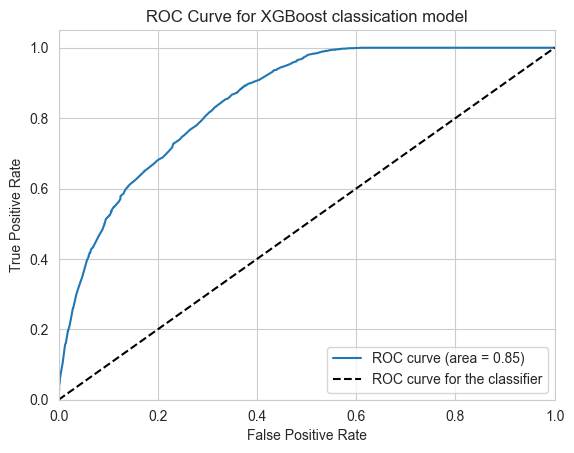

In [18]:
fpr, tpr, thresholds = roc_curve(y_test, xg_model.predict_proba(X_test)[:, 1])
plt.figure()
plt.plot(fpr , tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='ROC curve for the classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for XGBoost classication model')
plt.legend()
plt.show()

### Third model - LightGBM 

In [19]:
light_model = LGBMClassifier(metric='binary_error')
light_model.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 13178, number of negative: 13178
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 43
[LightGBM] [Info] Number of data points in the train set: 26356, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


LGBMClassifier(metric='binary_error')

In [20]:
y_pred = light_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f05_score = fbeta_score(y_test, y_pred, beta=0.5)  # F0.5 score (more weight on precision)
roc_auc = roc_auc_score(y_test, light_model.predict_proba(X_test)[:, 1])

print('accuracy = ', accuracy)
print('precision = ', precision)
print('recall = ', recall)
print('f05_score = ', f05_score)
print('roc_auc = ', roc_auc)

accuracy =  0.7587253414264037
precision =  0.7060671984529853
recall =  0.88649468892261
f05_score =  0.7360278183742377
roc_auc =  0.8484480324950896


In [21]:
grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [4, 6, 8, 10],
    'reg_lambda': [1, 3, 5, 7, 9]
}

light_model = GridSearchCV(estimator=light_model, param_grid=grid,
                            scoring='accuracy', cv=5, verbose=1)

In [22]:
light_model.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
[LightGBM] [Info] Number of positive: 10542, number of negative: 10542
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 43
[LightGBM] [Info] Number of data points in the train set: 21084, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

GridSearchCV(cv=5, estimator=LGBMClassifier(metric='binary_error'),
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [4, 6, 8, 10],
                         'reg_lambda': [1, 3, 5, 7, 9]},
             scoring='accuracy', verbose=1)

In [23]:
y_pred = light_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f05_score = fbeta_score(y_test, y_pred, beta=0.5)  # F0.5 score (more weight on precision)
roc_auc = roc_auc_score(y_test, light_model.predict_proba(X_test)[:, 1])

print('accuracy = ', accuracy)
print('precision = ', precision)
print('recall = ', recall)
print('f05_score = ', f05_score)
print('roc_auc = ', roc_auc)

accuracy =  0.7581183611532625
precision =  0.7055837563451777
recall =  0.8858877086494689
f05_score =  0.7355238623192056
roc_auc =  0.8489417681178775


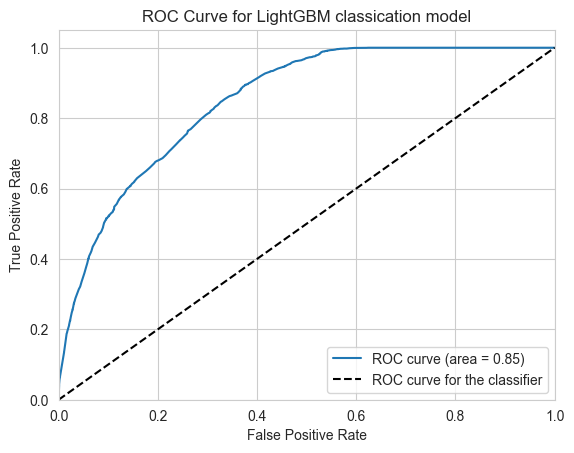

In [24]:
fpr, tpr, thresholds = roc_curve(y_test, light_model.predict_proba(X_test)[:, 1])
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='ROC curve for the classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for LightGBM classication model')
plt.legend()
plt.show()

# Explainable AI 

Below you can find LIME, a tool designed to explain the predictions of any ML classifier. LIME explains individual predictions, in this case every (for now) every  order row. 

In [25]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=cat_features,
                                                   class_names=['Abandoned', 'Completed'],
                                                   categorical_features=np.where(X_train.columns.isin(cat_features))[0],
                                                   verbose=True, mode='classification')
explanations = [] 

for i in range(len(X_test)):
    #i = 34 # Example index of instance to explain
    exp = explainer.explain_instance(X_test.values[i], xg_model.predict_proba, num_features=len(cat_features))
    explanations.append(exp.as_list())
#exp.show_in_notebook(show_table=True)

Intercept 0.5893885352697347
Prediction_local [0.247944]
Right: 0.33040258
Intercept 0.5221742670354206
Prediction_local [0.332026]
Right: 0.5454007
Intercept 0.5140041596412107
Prediction_local [0.04120876]
Right: 0.00020661524
Intercept 0.18782555255517044
Prediction_local [0.63217612]
Right: 0.7913263
Intercept 0.4256817157524154
Prediction_local [0.40169872]
Right: 0.61351585
Intercept 0.44313074445771883
Prediction_local [0.38813255]
Right: 0.61351585
Intercept 0.5477373826835505
Prediction_local [0.29451239]
Right: 0.41247463
Intercept 0.5423941553436815
Prediction_local [0.33622645]
Right: 0.43977696
Intercept 0.56878676822905
Prediction_local [0.31996722]
Right: 0.54564476
Intercept 0.5583960269987314
Prediction_local [0.36033496]
Right: 0.65205604
Intercept 0.8160478779128377
Prediction_local [-0.26150082]
Right: 0.00012362211
Intercept 0.15969442471007073
Prediction_local [0.68198936]
Right: 0.8966288
Intercept 0.42863349181983773
Prediction_local [0.44654489]
Right: 0.588757

In [26]:
# Define the mapping dictionary - after pilot test
feature_mapping = {
    'Discount_amount=0': 'No Discount',
    'Discount_amount=1': 'Discount Applied',
    'Small_order=1': 'Low total order amount',
    'Medium_order=1': 'Medium total order amount',
    'Semi-big_order=1': 'High total order amount',
    'Big_order=1': 'Very high total order amount',
    'Small_order=0': ' Not a Low total order amount',
    'Medium_order=0': 'Not a Medium total order amount',
    'Semi-big_order=0': 'Not a High total order amount',
    'Big_order=0': 'Not a Very high total order amount',
    'Total_nr_products=0': 'Single Product',
    'Total_nr_products=1': 'Multiple Products',
    'Low_average_total=1': 'Low average total order amount',
    'Medium_average_total=1': 'Medium average total order amount',
    'High_average_total=1': 'High average total order amount',
    'Low_max_viewed_price=1': 'Highest price in cart - low amount',
    'Medium_max_viewed_price=1': 'Highest price in cart - medium amount',
    'High_max_viewed_price=1': 'Highest price in cart - high amount',
    'Low_min_viewed_price=1': 'Lowest price in cart - low amount',
    'Medium_min_viewed_price=1': 'Lowest price in cart - medium amount',
    'High_min_viewed_price=1': 'Lowest price in cart - high amount',
    'Low_average_total=0': 'Not a Low average total order amount',
    'Medium_average_total=0': 'Not a Medium average total order amount',
    'High_average_total=0': 'Not a High average total order amount',
    'Low_max_viewed_price=0': 'Not the Highest price in cart - low amount',
    'Medium_max_viewed_price=0': 'Not the Highest price in cart - medium amount',
    'High_max_viewed_price=0': 'Not the Highest price in cart - high amount',
    'Low_min_viewed_price=0': 'Not the Lowest price in cart - low amount',
    'Medium_min_viewed_priced=0': 'Not the Lowest price in cart - medium amount',
    'High_min_viewed_price=0': 'Not the Lowest price in cart - high amount',
    'Total_orders=0': 'No Prior Orders',
    'Total_orders=1': 'Single Prior Order',
    'Total_orders=2': 'Multiple Prior Orders',
    'Different_products=0': 'No Variety',
    'Different_products=1': 'Varied Products',
    'night=1': 'Night Order',
    'morning=1': 'Morning Order',
    'afternoon=1': 'Afternoon Order',
    'evening=1': 'Evening Order',
    'night=0': 'Not a Night Order',
    'morning=0': 'Not a Morning Order',
    'afternoon=0': 'Not an Afternoon Order',
    'evening=0': 'Not an Evening Order'
        
}

Intercept 0.5344889837520982
Prediction_local [0.32777267]
Right: 0.5454007


C:\Users\fsmith\AppData\Local\Temp\ipykernel_18320\3755834567.py:21: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


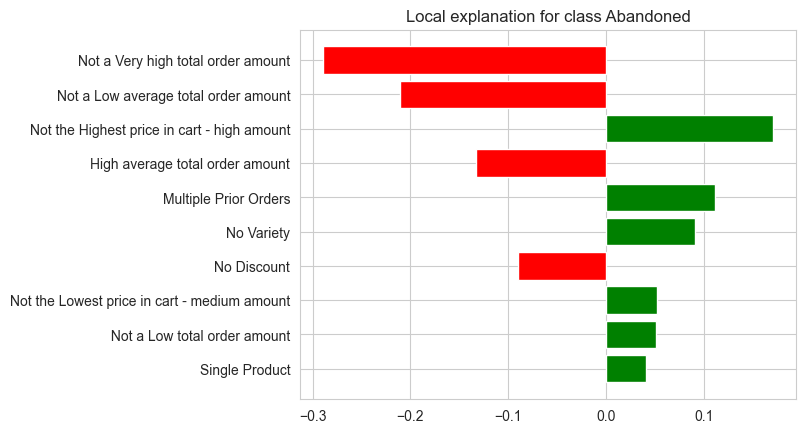

In [28]:
#local explanation
instance_1 = X_test[y_test == 0].iloc[32]   #specific instance for checkout abandonment
instance_2 = X_test[y_test == 1].iloc[0] # specific instance for successful checkout

explanation = explainer.explain_instance(
    data_row=instance_1,
    predict_fn=xg_model.predict_proba, 
    num_features=10 
)

fig = explanation.as_pyplot_figure()

# Update the plot with new feature names
ax = fig.gca()
labels = [item.get_text() for item in ax.get_yticklabels()]
new_labels = [feature_mapping.get(label, label) for label in labels]
ax.set_yticklabels(new_labels)

fig.show()

Intercept 0.6219971085386754
Prediction_local [0.29267642]
Right: 0.33040258


C:\Users\fsmith\AppData\Local\Temp\ipykernel_18320\3581887481.py:13: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


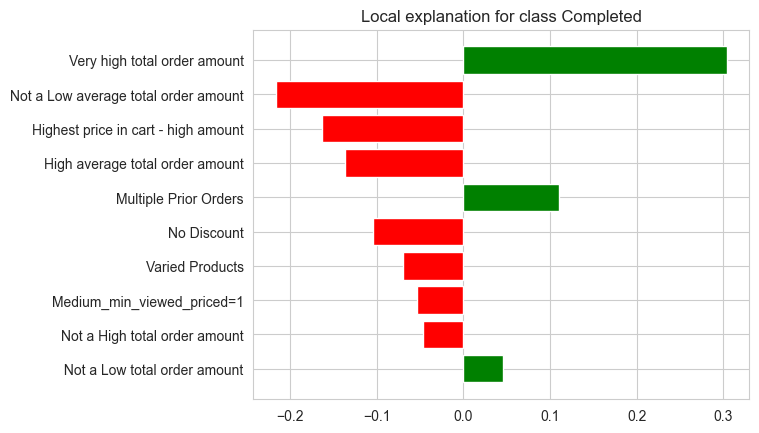

In [29]:
explanation = explainer.explain_instance(
    data_row=instance_2,
    predict_fn=xg_model.predict_proba, 
    num_features=10 
)

fig = explanation.as_pyplot_figure()
ax = fig.gca()
labels = [item.get_text() for item in ax.get_yticklabels()]
new_labels = [feature_mapping.get(label, label) for label in labels]
ax.set_yticklabels(new_labels)

fig.show()

In [30]:
# Initialize two dictionaries to collect feature importances for classes 0 and 1
feature_importances_class_0 = {}
feature_importances_class_1 = {}
predictions = xg_model.predict(X_test)

# Use the first explanation to get the feature names
feature_names = [feature for feature, _ in explanations[0]]
feature_importances_class_0 = {feature: [] for feature in feature_names}
feature_importances_class_1 = {feature: [] for feature in feature_names}

for prediction, explanation in zip(predictions, explanations):
    # row with zeros
    row = {feature: 0 for feature in feature_names}

    for feature, importance in explanation:
        row[feature] = importance

    if prediction == 0:
        for feature in feature_names:
            feature_importances_class_0[feature].append(row.get(feature, 0))
    elif prediction == 1:
        for feature in feature_names:
            feature_importances_class_1[feature].append(row.get(feature, 0))

# Convert dictionaries into DataFrames
explanation_matrix_class_0 = pd.DataFrame(feature_importances_class_0)
explanation_matrix_class_1 = pd.DataFrame(feature_importances_class_1)

In [31]:
explanation_matrix_class_0 = explanation_matrix_class_0.fillna(0)
explanation_matrix_class_0

,Big_order=1,Low_average_total=0,High_max_viewed_price=1,High_average_total=1,Total_orders=2,Discount_amount=0,Different_products=1,Medium_min_viewed_priced=1,Semi-big_order=0,Total_nr_products=1,...,Medium_order=0,Medium_max_viewed_price=0,night=0,Low_min_viewed_price=0,morning=0,High_min_viewed_price=0,Medium_average_total=0,evening=0,afternoon=1,Low_max_viewed_price=0
0,0.280400,-0.216987,-0.166400,-0.128119,0.117437,-0.097768,-0.087396,-0.057033,-0.049822,-0.041118,...,0.033199,0.023504,0.022683,-0.019567,-0.015910,0.014426,0.009380,-0.002425,-0.000926,0.000723
1,0.000000,-0.221120,0.000000,0.000000,0.000000,-0.100442,0.000000,0.000000,0.000000,0.000000,...,0.033109,0.000000,0.022409,-0.030570,-0.010194,0.000000,0.000000,-0.007604,-0.001452,0.004557
2,0.280099,-0.226937,-0.156821,-0.136007,0.117279,-0.096523,-0.070112,0.000000,-0.041925,-0.043080,...,0.039542,0.016320,0.021351,-0.024418,-0.027916,0.000000,0.010822,-0.002571,0.006458,-0.007645
3,0.000000,-0.222462,0.000000,0.000000,0.097144,-0.098412,-0.086969,0.000000,0.000000,-0.042734,...,0.036249,0.000000,0.006216,-0.034887,-0.016697,0.000000,0.000000,0.000000,0.000000,0.002578
4,0.000000,-0.229001,-0.159397,-0.130400,0.000000,-0.092151,0.000000,0.000000,0.000000,0.000000,...,0.030242,0.015952,0.015858,-0.036564,-0.014994,0.000000,0.008806,-0.011102,-0.001267,0.002685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2445,0.000000,-0.223474,0.000000,-0.132147,0.113833,-0.132572,-0.084362,0.000000,0.000000,-0.039735,...,0.030159,0.000000,0.027963,-0.033791,-0.016616,0.000000,-0.007785,-0.007495,-0.004843,-0.002182
2446,0.279025,-0.220631,0.000000,-0.138552,0.000000,-0.072278,-0.085487,-0.066253,-0.054856,-0.045802,...,0.042352,0.000000,0.034971,-0.028645,-0.018792,0.021661,-0.001270,-0.011244,-0.000238,-0.001111
2447,0.283429,-0.214848,-0.169279,-0.136978,0.000000,-0.095964,0.000000,0.000000,-0.041696,0.000000,...,0.036786,0.010538,-0.004665,-0.035392,0.000000,0.000000,0.009481,-0.007925,0.000000,0.001440
2448,0.000000,0.000000,0.000000,0.000000,0.000000,-0.092841,-0.086003,-0.058615,-0.052353,-0.042483,...,0.000000,0.016957,0.021761,-0.036415,0.000000,0.018177,0.002147,-0.002505,0.000000,0.000000


C:\Users\fsmith\AppData\Local\Temp\ipykernel_18320\2422135177.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels)


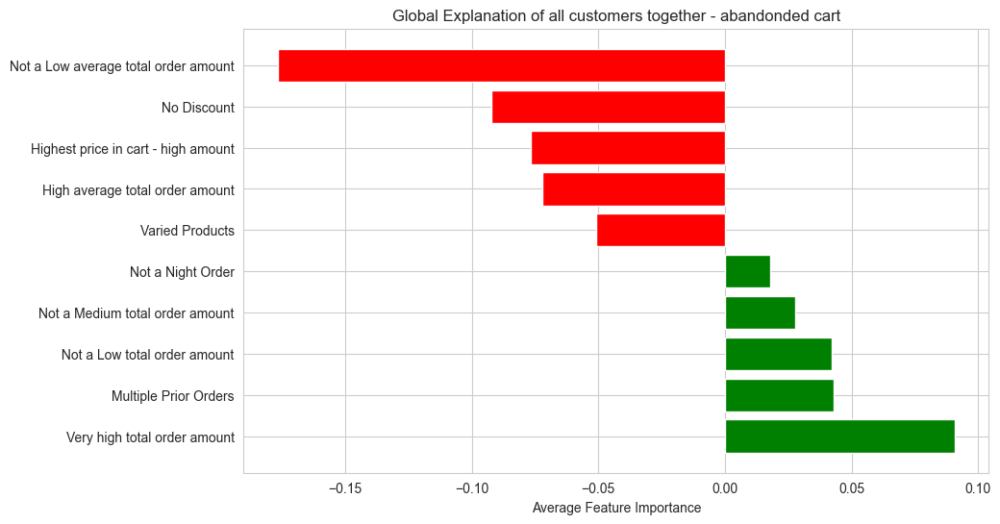

In [32]:
global_importances = explanation_matrix_class_0.mean(axis=0)
features = global_importances.index
importances = global_importances.values

xx = pd.Series(importances, features)
sorted_imp = xx.sort_values()

#top 5 and bottom 5 indices
top_5_indices = sorted_imp[-5:]
bottom_5_indices = sorted_imp[:5]

top_bottom_importances = pd.concat([bottom_5_indices, top_5_indices])

#green for positive values and red for negative values
colors = ['green' if val > 0 else 'red' for val in top_bottom_importances]

plt.figure(figsize=(10, 6))
plt.barh(top_bottom_importances.index, top_bottom_importances.values, color=colors)
plt.xlabel('Average Feature Importance')
plt.title('Global Explanation of all customers together - abandonded cart')

ax = plt.gca()
labels = [item.get_text() for item in ax.get_yticklabels()]
new_labels = [feature_mapping.get(label, label) for label in labels]
ax.set_yticklabels(new_labels)
ax.set_ylim(ax.get_ylim()[::-1])

plt.show()

In [33]:
explanation_matrix_class_1 = explanation_matrix_class_1.fillna(0)
explanation_matrix_class_1

,Big_order=1,Low_average_total=0,High_max_viewed_price=1,High_average_total=1,Total_orders=2,Discount_amount=0,Different_products=1,Medium_min_viewed_priced=1,Semi-big_order=0,Total_nr_products=1,...,Medium_order=0,Medium_max_viewed_price=0,night=0,Low_min_viewed_price=0,morning=0,High_min_viewed_price=0,Medium_average_total=0,evening=0,afternoon=1,Low_max_viewed_price=0
0,0.000000,-0.222593,0.000000,-0.136305,0.108992,-0.080421,0.000000,0.000000,0.000000,0.000000,...,0.040382,0.000000,-0.002076,-0.025882,0.000000,0.000000,-0.000720,-0.002108,0.000000,0.006737
1,0.000000,0.000000,0.000000,0.000000,0.000000,-0.091325,0.000000,-0.056449,-0.037115,0.000000,...,0.000000,0.017864,0.041787,-0.027726,-0.012024,0.023420,0.009101,-0.009025,-0.005857,0.000000
2,0.266360,-0.225584,-0.160306,-0.129947,0.114498,-0.103428,0.000000,0.000000,-0.036899,0.000000,...,0.028810,0.019167,0.036295,-0.031732,-0.011058,0.000000,0.006629,-0.011162,-0.008228,0.006060
3,0.275876,-0.228263,-0.165923,-0.139171,0.096476,-0.107496,0.000000,0.000000,-0.049628,0.000000,...,0.031635,0.018712,0.027359,-0.025143,-0.005032,0.000000,0.015798,0.000587,-0.013321,0.002295
4,0.284130,-0.232508,-0.168858,-0.133742,0.106837,-0.111902,-0.082118,0.000000,-0.035064,-0.040810,...,0.047527,0.001958,0.000000,0.000000,-0.012901,0.020619,0.001995,-0.015407,0.000000,-0.006379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4135,0.000000,0.000000,0.000000,0.000000,0.000000,-0.075435,-0.076968,0.000000,-0.047517,-0.038210,...,0.039934,0.016206,0.019659,0.000000,-0.000236,0.023462,0.005445,-0.007611,-0.011828,0.000000
4136,0.283812,-0.217126,-0.172621,0.000000,0.107497,-0.088510,-0.091891,0.000000,-0.047346,-0.048402,...,0.037189,0.013677,0.016823,0.000000,-0.000898,0.018123,0.000000,0.000000,0.000000,-0.004802
4137,0.000000,0.000000,0.000000,0.000000,0.000000,-0.075153,-0.099595,0.000000,-0.051727,-0.026910,...,0.033503,0.003437,0.016136,0.000000,-0.010954,0.014876,-0.009299,0.000000,0.000000,0.000000
4138,0.000000,0.000000,0.000000,0.000000,0.000000,-0.125558,0.000000,0.000000,-0.041567,0.000000,...,0.037023,0.006533,0.027538,0.000000,-0.012687,0.015229,-0.006936,0.000000,0.000000,0.000000


C:\Users\fsmith\AppData\Local\Temp\ipykernel_18320\3748016766.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(new_labels)


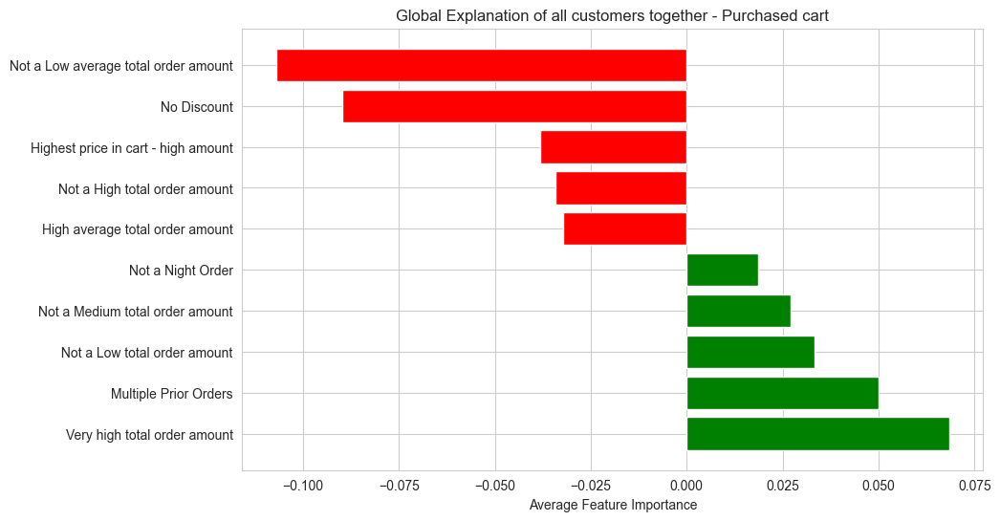

In [35]:
global_importances = explanation_matrix_class_1.mean(axis=0)
features = global_importances.index
importances = global_importances.values

xx = pd.Series(importances, features)
sorted_imp = xx.sort_values()

# top 5 and bottom 5 indices
top_5_indices = sorted_imp[-5:]
bottom_5_indices = sorted_imp[:5]
top_bottom_importances = pd.concat([bottom_5_indices, top_5_indices])

colors = ['green' if val > 0 else 'red' for val in top_bottom_importances]


plt.figure(figsize=(10, 6))
plt.barh(top_bottom_importances.index, top_bottom_importances.values, color=colors)
plt.xlabel('Average Feature Importance')
plt.title('Global Explanation of all customers together - Purchased cart')

ax = plt.gca()
labels = [item.get_text() for item in ax.get_yticklabels()]
new_labels = [feature_mapping.get(label, label) for label in labels]
ax.set_yticklabels(new_labels)
ax.set_ylim(ax.get_ylim()[::-1])

plt.show()

C:\Users\fsmith\anaconda3\envs\Thesis\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\fsmith\anaconda3\envs\Thesis\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\fsmith\anaconda3\envs\Thesis\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\fsmith\anaconda3\envs\Thesis\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` wi

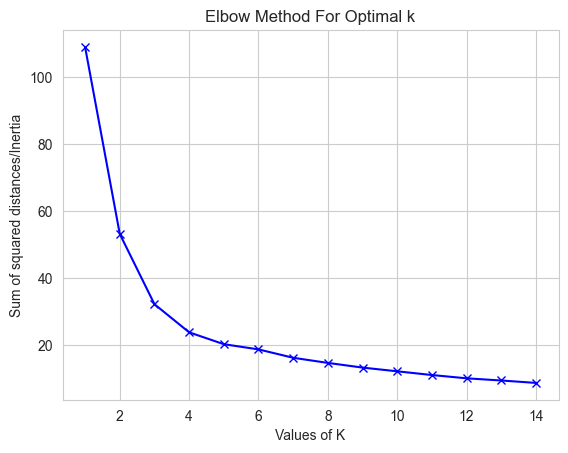

In [36]:
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k, random_state=0)
    km = km.fit(explanation_matrix_class_0)
    Sum_of_squared_distances.append(km.inertia_)

plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K')
plt.ylabel('Sum of squared distances/Inertia')
plt.title('Elbow Method For Optimal k')
plt.show()

In [37]:
num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
clusters_0 = kmeans.fit_predict(explanation_matrix_class_0)
clusters_1 = kmeans.fit_predict(explanation_matrix_class_1)

C:\Users\fsmith\anaconda3\envs\Thesis\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\fsmith\anaconda3\envs\Thesis\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [38]:
pca = PCA(n_components=2)
reduced_data_0 = pca.fit_transform(explanation_matrix_class_0)
reduced_df_0 = pd.DataFrame(reduced_data_0, columns=['Dimension 1', 'Dimension 2'])

reduced_data_1 = pca.fit_transform(explanation_matrix_class_1)
reduced_df_1 = pd.DataFrame(reduced_data_1, columns=['Dimension 1', 'Dimension 2'])


In [39]:
reduced_df_0['Cluster'] = clusters_0
reduced_df_1['Cluster'] = clusters_1

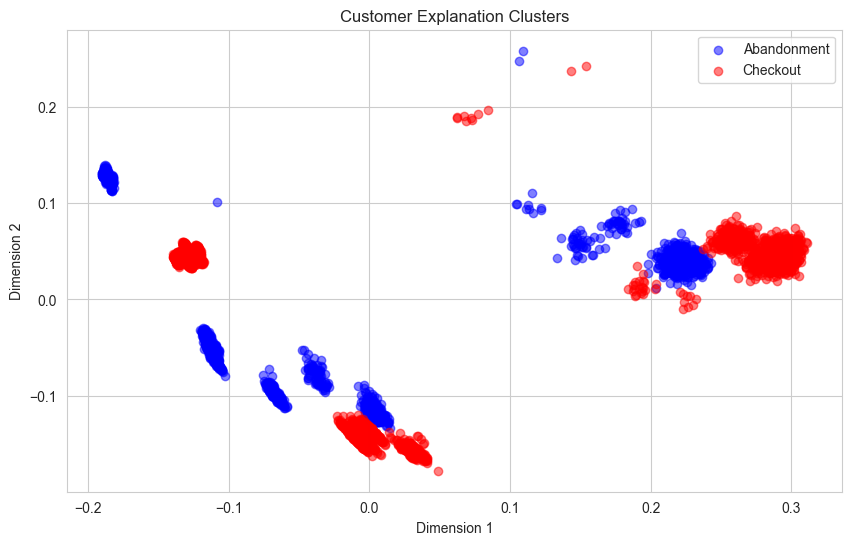

In [40]:
plt.figure(figsize=(10, 6))

# abandonment explanations
plt.scatter(reduced_df_0['Dimension 1'], reduced_df_0['Dimension 2'],
            color='blue', alpha=0.5, label='Abandonment')

# checkout explanations
plt.scatter(reduced_df_1['Dimension 1'], reduced_df_1['Dimension 2'],
            color='red', alpha=0.5, label='Checkout')

plt.title('Customer Explanation Clusters')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()

# Show the plot
plt.show()



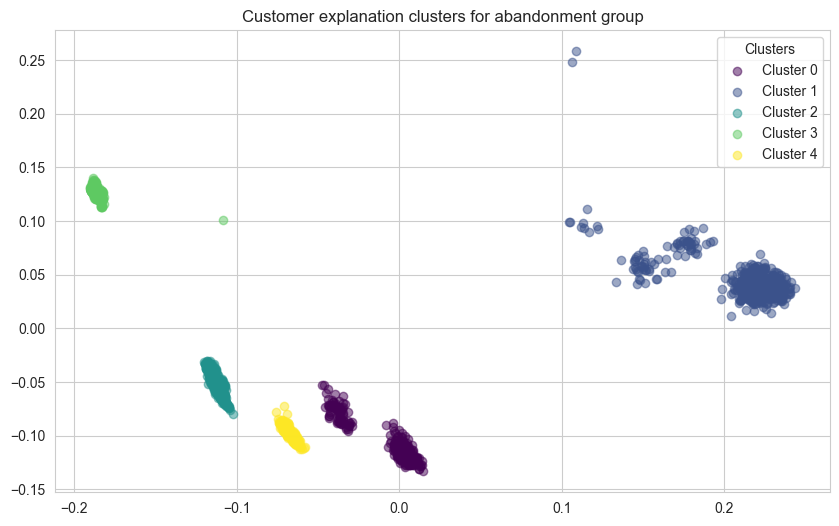

In [41]:
plt.figure(figsize=(10, 6))
cmap = plt.get_cmap('viridis')  
clusters = np.unique(reduced_df_0['Cluster'])


for cluster in clusters:
    cluster_data = reduced_df_0[reduced_df_0['Cluster'] == cluster]

    plt.scatter(cluster_data['Dimension 1'], cluster_data['Dimension 2'],
                c=[cmap((cluster - clusters.min()) / (clusters.max() - clusters.min()))], 
                label=f'Cluster {cluster}', alpha=0.5)

plt.title("Customer explanation clusters for abandonment group")
plt.legend(title='Clusters', loc='upper right')

plt.show()

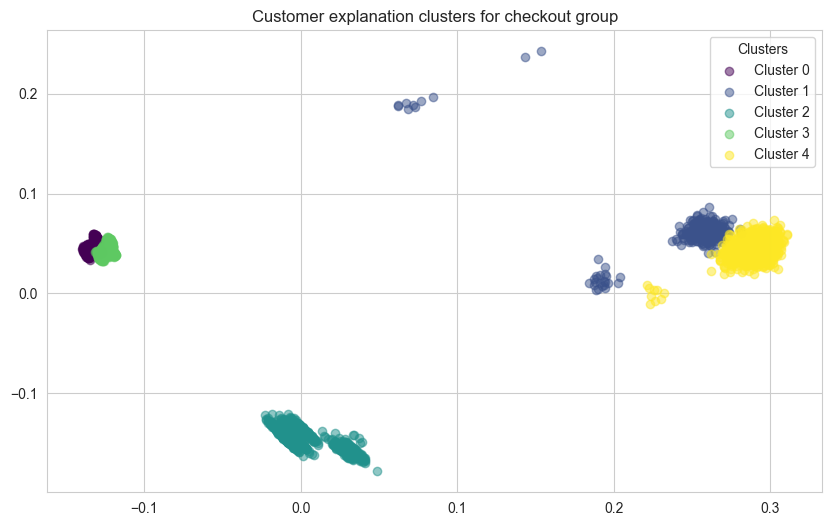

In [42]:
plt.figure(figsize=(10, 6))

cmap = plt.get_cmap('viridis') 
clusters = np.unique(reduced_df_1['Cluster'])

for cluster in clusters:
    cluster_data = reduced_df_1[reduced_df_1['Cluster'] == cluster]

    plt.scatter(cluster_data['Dimension 1'], cluster_data['Dimension 2'],
                c=[cmap((cluster - clusters.min()) / (clusters.max() - clusters.min()))],  
                label=f'Cluster {cluster}', alpha=0.5)

plt.title("Customer explanation clusters for checkout group")
plt.legend(title='Clusters', loc='upper right')

plt.show()

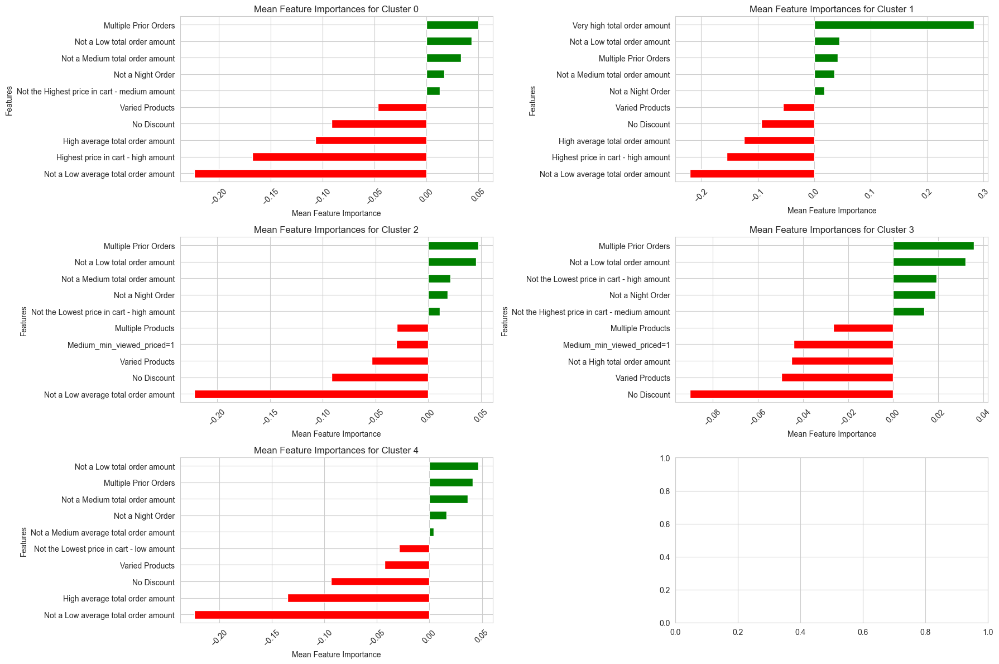

In [43]:
explanation_matrix_class_0['cluster'] = clusters_0
cluster_mean_importances_0 = explanation_matrix_class_0.groupby('cluster').mean()

# drop cluster column
if 'cluster' in cluster_mean_importances_0.columns:
    cluster_mean_importances_0.drop('cluster', axis=1, inplace=True)

cluster_mean_importances_0 = cluster_mean_importances_0.reset_index()
cluster_mean_importances_0 = cluster_mean_importances_0.drop(columns='cluster')

num_clusters = min(len(cluster_mean_importances_0), 5)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 12))
axes = axes.flatten() 

for i in range(num_clusters):
    cluster_features = cluster_mean_importances_0.iloc[i].sort_values(ascending=False)
    top_features = cluster_features.head(5)
    bottom_features = cluster_features.tail(5)
    
    selected_features = pd.concat([top_features, bottom_features])
    colors = ['green' if val > 0 else 'red' for val in selected_features]
    selected_features.plot(kind='barh', ax=axes[i], color=colors)

    ax = axes[i]
    labels = [item.get_text() for item in ax.get_yticklabels()]
    new_labels = [feature_mapping.get(label, label) for label in labels]
    ax.set_yticklabels(new_labels)
    ax.set_ylim(ax.get_ylim()[::-1])

    axes[i].set_title(f'Mean Feature Importances for Cluster {i}')
    axes[i].set_ylabel('Features')
    axes[i].set_xlabel('Mean Feature Importance')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


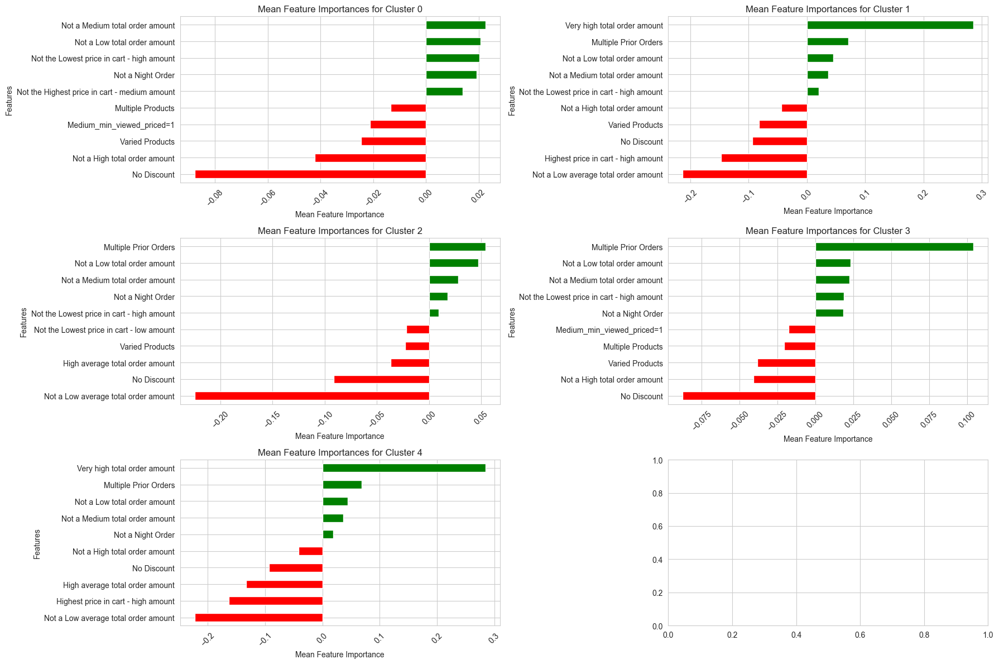

In [44]:
explanation_matrix_class_1['cluster'] = clusters_1
cluster_mean_importances_1 = explanation_matrix_class_1.groupby('cluster').mean()

if 'cluster' in cluster_mean_importances_1.columns:
    cluster_mean_importances_1.drop('cluster', axis=1, inplace=True)

cluster_mean_importances_1 = cluster_mean_importances_1.reset_index()
cluster_mean_importances_1 = cluster_mean_importances_1.drop(columns='cluster')
num_clusters = min(len(cluster_mean_importances_1), 5)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 12))
axes = axes.flatten() 

for i in range(num_clusters):
    cluster_features = cluster_mean_importances_1.iloc[i].sort_values(ascending=False)
    top_features = cluster_features.head(5)
    bottom_features = cluster_features.tail(5)

    selected_features = pd.concat([top_features, bottom_features])
    colors = ['green' if val > 0 else 'red' for val in selected_features]
    selected_features.plot(kind='barh', ax=axes[i], color=colors)

    ax = axes[i]
    labels = [item.get_text() for item in ax.get_yticklabels()]
    new_labels = [feature_mapping.get(label, label) for label in labels]
    ax.set_yticklabels(new_labels)
    ax.set_ylim(ax.get_ylim()[::-1])

    axes[i].set_title(f'Mean Feature Importances for Cluster {i}')
    axes[i].set_ylabel('Features')
    axes[i].set_xlabel('Mean Feature Importance')
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()